# Treball Quàntica

In [ ]:
!pip install pyscf        # amb el Colapse cal primer fer el !pip install
import pyscf
from pyscf import gto, scf, dft
import numpy as np
import matplotlib.pyplot as plt
import math
%matplotlib inline

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 38.2 MB 1.1 MB/s 


## Càlculs puntuals d'energia

### Estat fonamental

In [ ]:
r = 1.119 # segons les dades del NIST
basis_f1 = 'sto-3g'

mol = gto.Mole()
mol.atom = [
    ['H', (0., 0., 0)],
    ['C', (0., 0., r)]]
mol.basis = {'H': basis_f1,
             'C': basis_f1,}
mol.verbose = 0
mol.spin = 3
mol.build()

mf = scf.RHF(mol)
mf.conv_tol=1e-12
mf.conv_tol_grad=1e-8
mf.direct_scf_tol=1e-13
mf.init_guess='atom'
mf.max_cycle=100
mf.max_memory=8000
mf.verbose=0
e1 = mf.kernel()

e1_eV = e1*27.211

In [ ]:
r = 1.119 # segons les dades del NIST
basis_f2 = '6-311g**'

mol = gto.Mole()
mol.atom = [
    ['H', (0., 0., 0)],
    ['C', (0., 0., r)]]
mol.basis = {'H': basis_f2,
             'C': basis_f2,}
mol.verbose = 0
mol.spin = 3
mol.build()

mf = scf.RHF(mol)
mf.conv_tol=1e-12
mf.conv_tol_grad=1e-8
mf.direct_scf_tol=1e-13
mf.init_guess='atom'
mf.max_cycle=100
mf.max_memory=8000
mf.verbose=0
e2 = mf.kernel()

e2_eV = e2*27.211

In [ ]:
print("Energia(STO-3G): %s a.u.    %s eV\nEnergia(6-311G**): %s a.u.    %s eV\nRadi: %s Angstroms" % (e1,e1_eV,e2,e2_eV,r))

Energia(STO-3G): -37.7893360478593 a.u.    -1028.2856231982994 eV
Energia(6-311G**): -38.28345700037283 a.u.    -1041.7311484371448 eV
Radi: 1.119 Angstroms


### 1r estat excitat

In [ ]:
r = 1.119 # segons les dades del NIST
basis_f3 = 'sto-3g'

mol = gto.Mole()
mol.atom = [
    ['H', (0., 0., 0)],
    ['C', (0., 0., r)]]
mol.basis = {'H': basis_f3,
             'C': basis_f3,}
mol.verbose = 0
mol.spin = 1
mol.build()

mf = scf.RHF(mol)
mf.conv_tol=1e-12
mf.conv_tol_grad=1e-8
mf.direct_scf_tol=1e-13
mf.init_guess='atom'
mf.max_cycle=100
mf.max_memory=8000
mf.verbose=0
e1_exc = mf.kernel()

e1_exc_eV = e1_exc*27.211

In [ ]:
r = 1.119 # segons les dades del NIST
basis_f4 = '6-311g**'

mol = gto.Mole()
mol.atom = [
    ['H', (0., 0., 0)],
    ['C', (0., 0., r)]]
mol.basis = {'H': basis_f4,
             'C': basis_f4,}
mol.verbose = 0
mol.spin = 1
mol.build()

mf = scf.RHF(mol)
mf.conv_tol=1e-12
mf.conv_tol_grad=1e-8
mf.direct_scf_tol=1e-13
mf.init_guess='atom'
mf.max_cycle=100
mf.max_memory=8000
mf.verbose=0
e2_exc = mf.kernel()

e2_exc_eV = e2_exc*27.211

In [ ]:
print("Energia(STO-3G): %s a.u.    %s eV\nEnergia(6-311G**): %s a.u.    %s eV\nRadi: %s Angstroms" % (e1_exc,e1_exc_eV,e2_exc,e2_exc_eV,r))

Energia(STO-3G): -37.76869443822137 a.u.    -1027.7239443584415 eV
Energia(6-311G**): -38.273330672906525 a.u.    -1041.4556009404594 eV
Radi: 1.119 Angstroms


### Diferència entre excitat i fonamental

In [ ]:
D_sto3g = e1_exc - e1
D_6311 = e2_exc - e2

D_sto3g_eV = D_sto3g * 27.211
D_6311_eV = D_6311 * 27.211

print('Diferència energia (STO-3G): %s a.u.      %s eV\nDiferència energia (6-311G**): %s a.u.      %s eV' % (D_sto3g,D_sto3g_eV,D_6311,D_6311_eV))

Diferència energia (STO-3G): 0.020641609637934266 a.u.      0.5616788398578293 eV
Diferència energia (6-311G**): 0.010126327466302598 a.u.      0.27554749668556 eV


### Passar de ΔE a λ (nm)

$$
\Delta E=h\cdot\frac{c}{\lambda}\rightarrow\lambda=\frac{h\cdot c}{\Delta E}
$$

In [ ]:
h = 4.135667696e-15 #eV·s
c = 299792458 # m/s

wl_sto3g = (h*c)/D_sto3g_eV * 10**9 # nm
wl_6311 = (h*c)/D_6311_eV * 10**9 # nm

print("Longitud d'ona (STO-3G): %.7s nm\nLongitud d'ona (6-311G**): %.7s nm" %(wl_sto3g,wl_6311))

Longitud d'ona (STO-3G): 2207.38 nm
Longitud d'ona (6-311G**): 4499.55 nm


### Intent de visualització d'orbitals

In [ ]:
!pip install rdkit
from rdkit import Chem
from rdkit.Chem import AllChem, rdCoordGen
!pip install py3Dmol
import py3Dmol
!pip install pyscf        # amb el Colapse cal primer fer el !pip install
import pyscf
from pyscf import gto, lo, tools, dft

In [ ]:
smiles = 'c1ccccc1'
mol = Chem.MolFromSmiles(smiles)
mol = Chem.AddHs(mol)

AllChem.EmbedMolecule(mol)
AllChem.MMFFOptimizeMolecule(mol);

In [ ]:
v = py3Dmol.view()
v.addModel(Chem.MolToMolBlock(mol), 'mol')
v.setStyle({'stick':{}});

In [ ]:
elements = [atom.GetSymbol() for atom in mol.GetAtoms()]
coordinates = mol.GetConformer().GetPositions()
atoms = [(element, coordinate) for element, coordinate in zip(elements, coordinates)]

pyscf_mole = gto.Mole(basis="sto-3g")
pyscf_mole.atom = atoms
pyscf_mole.build();

In [ ]:
mf = dft.RKS(pyscf_mole)
mf.xc = 'b3lyp'
mf.run();

In [ ]:
dm = mf.make_rdm1()
naos = lo.nao.prenao(pyscf_mole, dm)

for i in range(naos.shape[1]):
    tools.cubegen.orbital(pyscf_mole, f'benzene_nao_{i+1:02d}.cube', naos[:,i],  nx=60, ny=60, nz=60)

In [ ]:
def draw_orbital(view, i):
    with open(f"./benzene_nao_{i:02d}.cube") as f:
        cube_data = f.read()
    view.addVolumetricData(cube_data, "cube", {'isoval': -0.04, 'color': "red", 'opacity': 0.75})
    view.addVolumetricData(cube_data, "cube", {'isoval': 0.04, 'color': "blue", 'opacity': 0.75})
    view.addModel(Chem.MolToMolBlock(mol), 'mol')
    view.setStyle({'stick':{}})
    view.zoomTo()
    view.update()
    view.clear()

view = py3Dmol.view(width=400,height=400)
view.show()
draw_orbital(view, 30)

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

Aquí faltaria trobar alguna manera de veure la contribució de cada orbital...

### Molècula carregada

In [ ]:
r = 1.119 # segons les dades del NIST
basis_f1 = 'sto-3g'

mol = gto.Mole()
mol.atom = [
    ['H', (0., 0., 0)],
    ['C', (0., 0., r)]]
mol.basis = {'H': basis_f1,
             'C': basis_f1,}
mol.verbose = 0
mol.spin = 2
mol.charge = 1
mol.build()

mf = scf.RHF(mol)
mf.conv_tol=1e-12
mf.conv_tol_grad=1e-8
mf.direct_scf_tol=1e-13
mf.init_guess='atom'
mf.max_cycle=100
mf.max_memory=8000
mf.verbose=0
e1_carr = mf.kernel()

In [ ]:
r = 1.119 # segons les dades del NIST
basis_f1 = '6-311g**'

mol = gto.Mole()
mol.atom = [
    ['H', (0., 0., 0)],
    ['C', (0., 0., r)]]
mol.basis = {'H': basis_f1,
             'C': basis_f1,}
mol.verbose = 0
mol.spin = 2
mol.charge = 1
mol.build()

mf = scf.RHF(mol)
mf.conv_tol=1e-12
mf.conv_tol_grad=1e-8
mf.direct_scf_tol=1e-13
mf.init_guess='atom'
mf.max_cycle=100
mf.max_memory=8000
mf.verbose=0
e2_carr = mf.kernel()

Ara calculem el potencial d'ionització

In [ ]:
PI_sto3g = e1_carr - e1
PI_6311 = e2_carr - e2

PI_sto3g_eV = PI_sto3g * 27.211
PI_6311_eV = PI_6311 * 27.211

In [ ]:
print("Potencial d'ionització (STO-3G): %s a.u.      %s eV\nPotencial d'ionització (6-311G**): %s a.u.      %s eV" % (PI_sto3g,PI_sto3g_eV,PI_6311,PI_6311_eV))

Potencial d'ionització (STO-3G): 0.33202933409540947 a.u.      9.034850210070186 eV
Potencial d'ionització (6-311G**): 0.38541503413825495 a.u.      10.487528493936056 eV


Calculem els errors respecte les dades del NIST

In [ ]:
PI_NIST_eV = 10.64 #eV - dada del NIST

Er_sto3g = abs(PI_sto3g_eV-PI_NIST_eV)/PI_NIST_eV * 100
Er_6311 = abs(PI_6311_eV-PI_NIST_eV)/PI_NIST_eV * 100

In [ ]:
print("Error relatiu (STO-3G): %.5s %%\nError relatiu (6-311G**): %.4s %%" % (Er_sto3g,Er_6311))

Error relatiu (STO-3G): 15.08 %
Error relatiu (6-311G**): 1.43 %


### Optimització

In [ ]:
!pip install geometric
!pip install -U pyberny

In [ ]:
r = 1.119 # segons les dades del NIST
basis_f1 = '6-311g**'

mol = gto.Mole()
mol.atom = [
    ['H', (0., 0., 0)],
    ['C', (0., 0., r)]]
mol.basis = {'H': basis_f1,
             'C': basis_f1,}
mol.spin = 3

np.random.seed(1)
coords = np.random.random((5,3)) * 10
charges = (np.arange(5) + 1.) * -.001
mf = qmmm.mm_charge(scf.RHF(mol), coords, charges)

mol1 = mf.Gradients().optimizer(solver='berny').kernel()

mycc = cc.CCSD(mf)
mol1 = mycc.Gradients().optimizer().kernel()

Initialize <pyscf.gto.mole.Mole object at 0x7faac8fe58b0> in ROHF-RHF object of <class 'pyscf.scf.rohf.ROHF'>
0 Internal coordinates:0 * Number of fragments: 10 * Number of internal coordinates: 10 * Number of strong bonds: 1


Geometry optimization cycle 1
Cartesian coordinates (Angstrom)
 Atom        New coordinates             dX        dY        dZ
   H   0.000000   0.000000   0.000000    0.000000  0.000000  0.000000
   C   0.000000   0.000000   1.119000    0.000000  0.000000  0.000000
converged SCF energy = -38.2834451788917
--------------- SCF_Scanner gradients ---------------
         x                y                z
0 H    -0.0000043550    -0.0000038073    -0.0297341815
1 C     0.0000069104     0.0000055773     0.0297330873
----------------------------------------------
cycle 1: E = -38.2834451789  dE = -38.2834  norm(grad) = 0.0420497


1 Energy: -38.28344517891 Pure RFO step was performed:1 * Trust radius: 0.31 * Number of negative eigenvalues: 01 * Lowest eigenvalue: 0.4621 * lambda: -0.00191 Quadratic step: RMS: 0.0641, max: 0.06411 * Predicted energy change: -0.0009561 Total step: RMS: 0.0641, max: 0.06411 Perfect transformation to cartesians in 2 iterations1 * RMS(dcart): 1.03e-16, RMS(dq): 8.88e-161 Convergence criteria:1 * Gradient RMS: 0.0297 > 0.00015 => no1 * Gradient maximum: 0.0297 > 0.00045 => no1 * Step RMS: 0.0641 > 0.0012 => no1 * Step maximum: 0.0641 > 0.0018 => no


Geometry optimization cycle 2
Cartesian coordinates (Angstrom)
 Atom        New coordinates             dX        dY        dZ
   H   0.000000   0.000000   0.016948    0.000000  0.000000  0.016948
   C   0.000000   0.000000   1.102052    0.000000  0.000000 -0.016948

WARN: Large deviations found between the input molecule and the molecule from chkfile
Initial guess density matrix may have large error.

converged SCF energy = -38.2846858638582
--------------- SCF_Scanner gradients ---------------
         x                y                z
0 H    -0.0000043455    -0.0000037875    -0.0082997871
1 C     0.0000068003     0.0000054855     0.0082987355
----------------------------------------------
cycle 2: E = -38.2846858639  dE = -0.00124068  norm(grad) = 0.0117369


2 Energy: -38.28468586392 Hessian update information:2 * Change: RMS: 0.128, max: 0.1282 Trust update: Fletcher's parameter: 1.32 Linear interpolation:2 * Energies: -38.284686, -38.2834452 * Derivatives: 0.000532, 0.00192 * Quartic interpolation was performed: t = -0.3412 * Interpolated energy: -38.2847772 Pure RFO step was performed:2 * Trust radius: 0.32 * Number of negative eigenvalues: 02 * Lowest eigenvalue: 0.3352 * lambda: -2.96e-062 Quadratic step: RMS: 0.00297, max: 0.002972 * Predicted energy change: -1.48e-062 Total step: RMS: 0.0248, max: 0.02482 Perfect transformation to cartesians in 2 iterations2 * RMS(dcart): 0.0, RMS(dq): 0.02 Convergence criteria:2 * Gradient RMS: 0.0083 > 0.00015 => no2 * Gradient maximum: 0.0083 > 0.00045 => no2 * Step RMS: 0.0248 > 0.0012 => no2 * Step maximum: 0.0248 > 0.0018 => no


Geometry optimization cycle 3
Cartesian coordinates (Angstrom)
 Atom        New coordinates             dX        dY        dZ
   H   0.000000   0.000000   0.023510    0.000000  0.000000  0.006562
   C   0.000000   0.000000   1.095490    0.000000  0.000000 -0.006562

WARN: Large deviations found between the input molecule and the molecule from chkfile
Initial guess density matrix may have large error.

converged SCF energy = -38.2847754176513
--------------- SCF_Scanner gradients ---------------
         x                y                z
0 H    -0.0000043429    -0.0000037808     0.0011960639
1 C     0.0000067590     0.0000054509    -0.0011970987
----------------------------------------------
cycle 3: E = -38.2847754177  dE = -8.95538e-05  norm(grad) = 0.00169225


3 Energy: -38.28477541773 Hessian update information:3 * Change: RMS: 0.0482, max: 0.04823 Trust update: Fletcher's parameter: 60.63 Linear interpolation:3 * Energies: -38.284775, -38.2846863 * Derivatives: -2.97e-05, 0.0002063 * Quartic interpolation was performed: t = 0.1223 * Interpolated energy: -38.2847773 Pure RFO step was performed:3 * Trust radius: 0.33 * Number of negative eigenvalues: 03 * Lowest eigenvalue: 0.3833 * lambda: -3.86e-093 Quadratic step: RMS: 0.0001, max: 0.00013 * Predicted energy change: -1.93e-093 Total step: RMS: 0.00313, max: 0.003133 Perfect transformation to cartesians in 2 iterations3 * RMS(dcart): 0.0, RMS(dq): 0.03 Convergence criteria:3 * Gradient RMS: 0.0012 > 0.00015 => no3 * Gradient maximum: 0.0012 > 0.00045 => no3 * Step RMS: 0.00313 > 0.0012 => no3 * Step maximum: 0.00313 > 0.0018 => no


Geometry optimization cycle 4
Cartesian coordinates (Angstrom)
 Atom        New coordinates             dX        dY        dZ
   H   0.000000   0.000000   0.022683    0.000000  0.000000 -0.000827
   C   0.000000   0.000000   1.096317    0.000000  0.000000  0.000827
converged SCF energy = -38.2847772223663
--------------- SCF_Scanner gradients ---------------
         x                y                z
0 H    -0.0000043469    -0.0000037853    -0.0000405438
1 C     0.0000067679     0.0000054590     0.0000395068
----------------------------------------------
cycle 4: E = -38.2847772224  dE = -1.80472e-06  norm(grad) = 5.75623e-05


4 Energy: -38.28477722244 Hessian update information:4 * Change: RMS: 0.0128, max: 0.01284 Trust update: Fletcher's parameter: 9.35e+024 Linear interpolation:4 * Energies: -38.284777, -38.2847754 * Derivatives: -1.25e-07, 3.74e-064 * Cubic interpolation was performed: t = 0.03254 * Interpolated energy: -38.2847774 Pure RFO step was performed:4 * Trust radius: 0.34 * Number of negative eigenvalues: 04 * Lowest eigenvalue: 0.3964 * lambda: -5.88e-144 Quadratic step: RMS: 3.85e-07, max: 3.85e-074 * Predicted energy change: -2.94e-144 Total step: RMS: 0.000101, max: 0.0001014 Perfect transformation to cartesians in 2 iterations4 * RMS(dcart): 0.0, RMS(dq): 0.04 Convergence criteria:4 * Gradient RMS: 4e-05 < 0.00015 => OK4 * Gradient maximum: 4e-05 < 0.00045 => OK4 * Step RMS: 0.000101 < 0.0012 => OK4 * Step maximum: 0.000101 < 0.0018 => OK4 * All criteria matched


WARN: RCCSD method does not support ROHF method. ROHF object is converted to UHF object and UCCSD method is called.



geometric-optimize called with the following command line:
/usr/local/lib/python3.8/dist-packages/ipykernel_launcher.py -f /root/.local/share/jupyter/runtime/kernel-46aa8375-098b-41ae-a659-5ae93310e113.json

                                        ())))))))))))))))/                     
                                    ())))))))))))))))))))))))),                
                                *)))))))))))))))))))))))))))))))))             
                        #,    ()))))))))/                .)))))))))),          
                      #%%%%,  ())))))                        .))))))))*        
                      *%%%%%%,  ))              ..              ,))))))).      
                        *%%%%%%,         ***************/.        .)))))))     
                #%%/      (%%%%%%,    /*********************.       )))))))    
              .%%%%%%#      *%%%%%%,  *******/,     **********,      .))))))   
                .%%%%%%/      *%%%%%%,  **              ********      .)


Geometry optimization cycle 1
Cartesian coordinates (Angstrom)
 Atom        New coordinates             dX        dY        dZ
   H   0.000000   0.000000   0.000000    0.000000  0.000000  0.000000
   C   0.000000   0.000000   1.119000    0.000000  0.000000  0.000000
converged SCF energy = -38.2851726339285  <S^2> = 3.7541001  2S+1 = 4.0020495
E(CCSD_Scanner) = -38.38521574503683  E_corr = -0.1000431111082838
--------------- CCSD_Scanner gradients ---------------
         x                y                z
0 H    -0.0000060644    -0.0000054945    -0.0168402655
1 C     0.0000087904     0.0000075217     0.0168387385
----------------------------------------------
cycle 1: E = -38.385215745  dE = -38.3852  norm(grad) = 0.0238147


Step    0 : Gradient = 1.684e-02/1.684e-02 (rms/max) Energy = -38.3852157450
Hessian Eigenvalues: 5.00000e-02 5.00000e-02 5.00000e-02 ... 5.00000e-02 5.00000e-02 3.16654e-01



Geometry optimization cycle 2
Cartesian coordinates (Angstrom)
 Atom        New coordinates             dX        dY        dZ
   H   0.000140   0.000127   0.014087    0.000140  0.000127  0.014087
   C  -0.000198  -0.000170   1.104945   -0.000198 -0.000170 -0.014055

WARN: Large deviations found between the input molecule and the molecule from chkfile
Initial guess density matrix may have large error.

converged SCF energy = -38.2863286098187  <S^2> = 3.7542102  2S+1 = 4.0021046
E(CCSD_Scanner) = -38.38566742439899  E_corr = -0.09933881458030522
--------------- CCSD_Scanner gradients ---------------
         x                y                z
0 H    -0.0000061606    -0.0000055676     0.0003398045
1 C     0.0000087955     0.0000075225    -0.0003412736
----------------------------------------------
cycle 2: E = -38.3856674244  dE = -0.000451679  norm(grad) = 0.000481807


Step    1 : Displace = 1.407e-02/1.407e-02 (rms/max) Trust = 1.000e-01 (=) Grad = 3.407e-04/3.415e-04 (rms/max) E (change) = -38.3856674244 (-4.517e-04) Quality = 1.009
Hessian Eigenvalues: 4.99990e-02 5.00000e-02 5.00000e-02 ... 5.00000e-02 5.00000e-02 3.23061e-01



Geometry optimization cycle 3
Cartesian coordinates (Angstrom)
 Atom        New coordinates             dX        dY        dZ
   H   0.000274   0.000247   0.013823    0.000133  0.000120 -0.000263
   C  -0.000386  -0.000331   1.105239   -0.000188 -0.000161  0.000294
converged SCF energy = -38.2863149827839  <S^2> = 3.7542096  2S+1 = 4.0021043
E(CCSD_Scanner) = -38.38566760036443  E_corr = -0.09935261758050652
--------------- CCSD_Scanner gradients ---------------
         x                y                z
0 H    -0.0000056628    -0.0000051317    -0.0000303654
1 C     0.0000082980     0.0000070876     0.0000288934
----------------------------------------------
cycle 3: E = -38.3856676004  dE = -1.75965e-07  norm(grad) = 4.39816e-05


Step    2 : Displace = 2.788e-04/2.788e-04 (rms/max) Trust = 1.414e-01 (+) Grad = 3.110e-05/3.131e-05 (rms/max) E (change) = -38.3856676004 (-1.760e-07) Quality = 0.959
Hessian Eigenvalues: 4.99990e-02 5.00000e-02 5.00000e-02 ... 5.00000e-02 5.00000e-02 3.23061e-01
Converged! =D

    #==========================================================================#
    #| If this code has benefited your research, please support us by citing: |#
    #|                                                                        |#
    #| Wang, L.-P.; Song, C.C. (2016) "Geometry optimization made simple with |#
    #| translation and rotation coordinates", J. Chem, Phys. 144, 214108.     |#
    #| http://dx.doi.org/10.1063/1.4952956                                    |#
    #==========================================================================#
    Time elapsed since start of run_optimizer: 3.259 seconds


### Energia de dissociació i energies atòmiques

In [ ]:
basis_f1 = '6-311g**'

mol = gto.Mole()
mol.atom = [
    ['H', (0., 0., 0)]]
mol.basis = {'H': basis_f1}
mol.verbose = 0
mol.spin = 1
mol.build()

mf = scf.RHF(mol)
mf.conv_tol=1e-12
mf.conv_tol_grad=1e-8
mf.direct_scf_tol=1e-13
mf.init_guess='atom'
mf.max_cycle=100
mf.max_memory=8000
mf.verbose=0
mf.kernel()

eH = mf.kernel()
eH_kJmol = eH * 2625

In [ ]:
print("Energia H (6-311G**): %s a.u.      %s kJ/mol" % (eH,eH_kJmol))

Energia H (6-311G**): -0.49980981527328144 a.u.      -1312.0007650923637 kJ/mol


In [ ]:
basis_f1 = '6-311g**'

mol = gto.Mole()
mol.atom = [
    ['C', (0., 0., 0)]]
mol.basis = {'C': basis_f1}
mol.verbose = 0
mol.spin = 2
mol.build()

mf = scf.RHF(mol)
mf.conv_tol=1e-12
mf.conv_tol_grad=1e-8
mf.direct_scf_tol=1e-13
mf.init_guess='atom'
mf.max_cycle=100
mf.max_memory=8000
mf.verbose=0
mf.kernel()

eC = mf.kernel()
eC_kJmol = eC * 2625

In [ ]:
print("Energia C (6-311G**): %s a.u.      %s kJ/mol" % (eC,eC_kJmol))

Energia C (6-311G**): -37.68482448223777 a.u.      -98922.66426587415 kJ/mol


\begin{equation*}
    CH \rightarrow C + H
\end{equation*}
\begin{equation*}
    E_{diss.}=(E_C+E_H)-E_{CH}
\end{equation*}

In [ ]:
E_diss = eC + eH - e2
E_diss_kJmol = E_diss * 2625
print("Energia dissociació (6-311G**): %s a.u.      %s kJ/mol" % (E_diss,E_diss_kJmol))

Energia dissociació (6-311G**): 0.0988227028617743 a.u.      259.4095950121575 kJ/mol


\begin{equation*}
    E_{diss.}^*=(E_{C^*}+E_{H^*})-E_{CH^*}
\end{equation*}

In [ ]:
basis_f1 = '6-311g**'

mol = gto.Mole()
mol.atom = [
    ['H', (0., 0., 0)]]
mol.basis = {'H': basis_f1}
mol.verbose = 0
mol.spin = 1

mol.build()

mf = scf.RHF(mol)
mf.conv_tol=1e-12
mf.conv_tol_grad=1e-8
mf.direct_scf_tol=1e-13
mf.init_guess='atom'
mf.max_cycle=100
mf.max_memory=8000
mf.verbose=0
mf.kernel()

eH_exc = mf.kernel()
eH_exc_kJmol = eH_exc * 2625

In [ ]:
print("Energia H excitat (6-311G**): %s a.u.      %s kJ/mol" % (eH_exc,eH_exc_kJmol))

Energia H excitat (6-311G**): -0.49980981527328144 a.u.      -1312.0007650923637 kJ/mol


In [ ]:
basis_f1 = '6-311g**'

mol = gto.Mole()
mol.atom = [
    ['C', (0., 0., 0)]]
mol.basis = {'C': basis_f1}
mol.verbose = 0
mol.spin = 4
mol.build()

mf = scf.RHF(mol)
mf.conv_tol=1e-12
mf.conv_tol_grad=1e-8
mf.direct_scf_tol=1e-13
mf.init_guess='atom'
mf.max_cycle=100
mf.max_memory=8000
mf.verbose=0
mf.kernel()

eC_exc = mf.kernel()
eC_exc_kJmol = eC * 2625

In [ ]:
print("Energia C excitat (6-311G**): %s a.u.      %s kJ/mol" % (eC_exc,eC_exc_kJmol))

Energia C excitat (6-311G**): -37.594812365037896 a.u.      -98686.38245822434 kJ/mol


In [ ]:
E_diss_exc = eC_exc + eH_exc - e2
E_diss_exc_kJmol = E_diss_exc * 2625
print("Energia dissociació (6-311G**): %s a.u.      %s kJ/mol" % (E_diss_exc,E_diss_exc_kJmol))

Energia dissociació (6-311G**): 0.18883482006165053 a.u.      495.6914026618326 kJ/mol


### PES

In [ ]:
r = 0.9
r0 = r

radius = []
energy = []

while r < 1.3:

  radius.append(r)

  basis_f1 = '6-311g**'

  mol.atom = [
      ['H', (0., 0., 0)],
      ['C', (0., 0., r)]]
  mol.basis = {'H': basis_f1,
               'C': basis_f1,}
  mol.verbose = 0
  mol.spin = 3
  mol.build()

  mf = scf.RHF(mol)
  mf.conv_tol=1e-12
  mf.conv_tol_grad=1e-8
  mf.direct_scf_tol=1e-13
  mf.init_guess='atom'
  mf.max_cycle=100
  mf.max_memory=8000
  mf.verbose=0
  e = mf.kernel()
  energy.append(e)
  # print("%s     %s" % (mf.kernel(),r))

  r = r + 0.01 * np.random.random_sample()

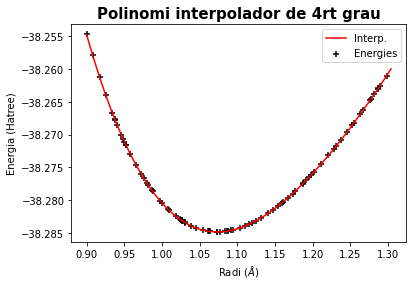

Energia mínima: -38.28478838552336 Hatree
Radi de mínima energia: 1.0735391320204402 Angstroms

Polinomi interpolador:
       4         3         2
1.562 x - 8.118 x + 16.05 x - 14.12 x - 33.65

       1a derivada: 
      3         2
6.25 x - 24.35 x + 32.09 x - 14.12
 
       2a derivada: 
       2
18.75 x - 48.71 x + 32.09

       3a derivada: 
 
37.5 x - 48.71

       4a derivada: 
 
37.5
 


In [ ]:
U_r = np.poly1d(np.polyfit(radius, energy, 4))

valors = np.linspace(r0, r, len(radius))

index = energy.index(min(energy))


plt.title('Polinomi interpolador de 4rt grau', size=15, fontweight="bold")
plt.xlabel("Radi ($\AA$)")
plt.ylabel("Energia (Hatree)")
plt.scatter(radius,energy, label="Energies", marker="+", color='black')
plt.plot(valors, U_r(valors), label="Interp.", color='red')
plt.legend(loc="best")
plt.show()

print("Energia mínima: %s Hatree" % min(energy))
print("Radi de mínima energia: %s Angstroms\n" % radius[index])
print("Polinomi interpolador:\n%s" % U_r)

# Derivades de la funció U(r)
f = U_r

df1 = f.deriv(m=1) # 1a derivada
df2 = f.deriv(m=2) # 2a derivada
df3 = f.deriv(m=3) # 3a derivada
df4 = f.deriv(m=4) # 4a derivada
print(f'''
       1a derivada: \n{df1}\n
       2a derivada: \n{df2}\n
       3a derivada: \n{df3}\n
       4a derivada: \n{df4}\n ''')

# Treball Espectro

### Càlcul constants

Ara calculem les constants espectroscòpiques pròpies de la nostre molècula diatòmica.
Fòrmules:
<!-- $$B_e = \frac{h}{8\pi^2 \mu R_e^2}$$

$$\nu_e=\frac{1}{2\pi}\sqrt{\frac{k}{\mu}} ;~~ k=U^{II}(R_e)$$

$$D_e = \frac{4 B_e^3}{\nu_e^2}$$

$$\nu_e \chi_e = \frac{B_e^2 R_e^4}{4 h \nu_e^2} \left[ \frac{10 B_e R_e^2 [U^{III}(R_e)]^2}{3 h \nu_e^2} -U^{IV}(R_e) \right]$$

$$\alpha_e = -\frac{2 B_e^2}{\nu_e} \left[ \frac{2 B_e R_e^3 U^{III}(R_e)}{h \nu_e^2} +3 \right]$$ -->

\begin{equation}\tag{1}
   B_e=\frac{h}{8\pi^2\mu R_e^2}
\end{equation}
\begin{equation}\tag{2}
   D_e=\frac{4B_e^3}{\nu_e^2}
\end{equation}
\begin{equation}\tag{3}
   \nu_e=\frac{1}{2\pi}\sqrt{\frac{k}{\mu}}\hspace{0.5cm}k=U^{II}(R_e)\hspace{0.5cm}\mu=\frac{m_C\cdot m_H}{m_C+m_H}
\end{equation}
\begin{equation}\tag{4}
   \nu_e\chi_e=\frac{B_e^2R_e^4}{4h\nu_e^2}\left[\frac{10B_eR_e^3\left[U^{III}(R_e)\right]^2}{3h\nu_e}-U^{IV}(R_e)\right]
\end{equation}
\begin{equation}\tag{5}
   \alpha_e=-\frac{2B_e^2}{\nu_e}\left[\frac{2B_eR_e^3U^{III}(R_e)}{h\nu_e^2}+3\right]
\end{equation}

\begin{equation}
\begin{gathered}
  E_{v,J,m_J}=U_0(R_e)+hB_eJ(J+1)-hD_eJ^2(J+1)^2+h\nu_e\left(v+\frac{1}{2}\right)\\-h\nu_e\chi_e\left(v+\frac{1}{2}\right)^2-h\alpha_eJ(J+1)(v+\frac{1}{2})+hY_{00}
\end{gathered}\tag{6}
\end{equation}

In [ ]:
# Constants universals
h = 6.6260693*10**(-34) #Planck [J·s]
Re = radius[index] * 10**(-10) # radi d'equilibri [m]
MW_C = 12.011 # uma
MW_H = 1.00784 # uma

mu = (MW_C*MW_H)/(MW_C+MW_H) * 9.109*10**(-31) # massa reduida [kg]
k = df2(Re)
nu = 1/(2*math.pi)*math.sqrt(k/mu)

B = h/(8*math.pi**2*mu*Re**2)
D = 4*B**3/nu**2
nuchi = (B**2*Re**2)/(4*h*nu**2)*((10*B*Re**2*df3(Re)**2)/(3*h*nu)-df4(Re))
alpha = -(2*B**2)/(nu)*((2*B*Re**3*df3(Re))/(h*nu**2)+3)


# # Càlcul de les constants de la molècula
# Re = f.deriv(). roots
# for i in Re:
#   if i < i+1:
#     Re = float(i.real)
# print(Re)

# # @@ per H2O (buscar llibreria per no haver d'introduir MW)
# mu = ( (1*1*16)/(1+1+16) ) * 6.023*10**(-26) # no ho tinc clar
# B_e = (h/(8*math.pi**2 *mu *Re**2)) * 3*10**(-10) # cm^-1
# nu_e = ((2*math.pi)**(-1) ) * math.sqrt(df2(Re)/mu) # cm^-1
# #D_e =
# #nu_e_chi_e =
# #alpha_e =

In [ ]:
!pip install psikit

In [ ]:
!pip install rdkit

In [ ]:
!pip install psi4

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
ERROR: Could not find a version that satisfies the requirement psi4 (from versions: none)
ERROR: No matching distribution found for psi4


In [ ]:
import sys
sys.path.append('/Users/iwatobipen/develop/chemoenv/psikit/psikit')
from psikit import Psikit
from rdkit import Chem
pk = Psikit()
# acetic acid
pk.read_from_smiles("CC(=O)[O-]")
pk.optimize()
Chem.MolToMolFile(pk.mol, 'acetic_acid.mol')
pk.getMOview()

# tetrazole
pk.read_from_smiles("CC1=NN=N[N-]1")
pk.optimize()
pk.getMOview()

ModuleNotFoundError: ignored